## Install required Python packages

In [ ]:
%%capture
!pip install skggm
!pip install scikit-learn==0.21.3

In [ ]:
%%capture 
from inverse_covariance import QuicGraphLasso
from inverse_covariance import QuicGraphLassoCV
from inverse_covariance import QuicGraphicalLassoEBIC 

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import sys

In [ ]:
from inverse_covariance import QuicGraphicalLasso 

## Download latest Octave compile

In [ ]:
%%capture
! apt-get update
! apt-get install libgraphicsmagick++1-dev libsuitesparse-dev libqrupdate1 \
libfftw3-3 gnuplot zsh openjdk-8-jdk
! pip install oct2py octave_kernel

In [ ]:
import os, urllib.request, json

In [ ]:
%%capture
# download compiled octave package (latest)
def get_CERRoctave(root_path):
  os.chdir(root_path)
  with urllib.request.urlopen("https://api.github.com/repos/cerr/octave-colab/releases/latest") as url:
      data = json.loads(url.read().decode())
  fname = data['assets'][0]['name']
  requrl = data['assets'][0]['browser_download_url']
  urllib.request.urlretrieve(requrl, fname)
  # unzip, identify octave folder name
  !tar xf {fname}
  top_folder = !tar tf {fname} | head -1
  octave_folder = top_folder[0][:-1]
  octave_path = os.path.join(root_path,octave_folder)
  return octave_path


octave_path = getOctave('/content')
os.environ['OCTAVE_EXECUTABLE'] = octave_path + '/bin/octave-cli'
os.environ['PATH'] = octave_path + '/bin:' + os.environ['PATH']

In [ ]:
%%capture
!pip3 install octave_kernel
!pip3 install oct2py==5.3.0

%load_ext oct2py.ipython

### Download CERR

In [ ]:
%%octave

#Add CERRx to path
cerrPath = '/content/CERR'
currDir = pwd
cd(cerrPath)
addToPath2(cerrPath)
cd(currDir)

### Compute radiomic features

In [ ]:
%%octave
# Path to data
dataDir = '/path/to/input/cerr_archives';
# Path to calculation settings (JSON)
paramFileName = '/path/to/input/cerr_archives';

In [ ]:
%%octave
# Initialize structure arrays for feature storage
shapeS = struct('majorAxis', '', 'minorAxis', '', 'leastAxis', '', 'flatness', '', ...
    'elongation', '', 'max3dDiameter', '', 'max2dDiameterAxialPlane', '', ...
    'max2dDiameterSagittalPlane', '', 'max2dDiameterCoronalPlane', '', 'surfArea', '', ...
    'volume', '', 'filledVolume', '', 'Compactness1', '', 'Compactness2', '', ...
    'spherDisprop', '', 'sphericity', '', 'surfToVolRatio', '');

shapeS(:) = [];

templateFirstOrderS = struct('min','','max','','mean','','range','',...
    'std','','var','','median','','skewness','','kurtosis','',...
    'entropy', '', 'rms','','energy', '', 'totalEnergy','','meanAbsDev','', ...
    'medianAbsDev', '', 'P10', '', 'P90', '', 'robustMeanAbsDev', '', ...
    'robustMedianAbsDev', '', 'interQuartileRange', '',...
    'coeffDispersion', '', 'coeffVariation', '');
templateFirstOrderS(:) = [];
RadiomicsFirstOrderCtS = templateFirstOrderS;
rlmTemplateS = struct('sre','','lre','','gln','','glnNorm','','rln','','rlnNorm',...
    '','rp','','lglre','','hglre','','srlgle','','srhgle','','lrlgle','','lrhgle','',...
    'glv','','rlv','','re','');
rlmTemplateS(:) = [];
rlmCTS = rlmTemplateS;
haralickEntireStructS = struct('energy','','jointEntropy','','jointMax','',...
    'jointAvg','','jointVar','','contrast','','invDiffMom','',...
    'invDiffMomNorm','','invDiff','', 'invDiffNorm', '', 'invVar', '', ...
    'dissimilarity','','diffEntropy','', 'diffVar', '', 'diffAvg', '', ...
    'sumAvg','','sumVar','', 'sumEntropy', '', 'corr', '', ...
    'clustTendency','','clustShade','', 'clustPromin', '', 'haralickCorr', '', ...
    'autoCorr','','firstInfCorr','', 'secondInfCorr', '');
haralickEntireStructS(:) = [];

In [ ]:
%%octave

# Read feature-specific configurations from JSON
paramS = getRadiomicsParamTemplate(paramFileName);

# Extract radiomics features
errC = {};
dirS = dir(dataDir);
dirS(1:2) = [];
all_filenames = {dirS.name};
for iFile = 1:length(all_filenames)
    try
        #Load plan
        fullFname = fullfile(dataDir,all_filenames{iFile});
        planC = loadPlanC(fullFname, tempdir);
        planC = quality_assure_planC(fullFname, planC);
        indexS = planC{end};

        #Get GTV struct num
        %structName = 'GTV';
        strC = {planC{indexS.structures}.structureName};
        %structNum = getMatchingIndex(strtrim(structName),strC,'exact');
        structNum = findTumorIndex(1,planC);

        #Compute features
        scanNum = 1; % CT
        featS = calcGlobalRadiomicsFeatures(scanNum, structNum, ...
            paramS, planC);

        featS.fileName = all_filenames{iFile};
        featS.structName = strC{structNum};

        featureS(iFile) = featS;

    catch e

      errC{iFile} = ['Pt ', all_filenames{iFile}, ' failed with ' e.message];

    end

end

### Aggregate features across cohort

In [ ]:
%%octave

#Aggregate features
featClass = fieldnames(featureS(1).shapeS);
dataM = [];
count = 0;
fNameC = {};
for n = 1:length(featClass)
    fValC = arrayfun(@(x)x.shapeS.(featClass{n}),featureS,'un',0);
    count = count+1;
    fNameC{end+1} = ['shape_',featClass{n}];
    dataM = [dataM,[fValC{:}].'];
end

featClass = fieldnames(featureS(1).Original);
for n = 1:length(featClass)
    if isfield(featureS(1).Original.(featClass{n}),'AvgS')
        for k = 1:length(featureS)
            featureS(k).Original.(featClass{n}) = [featureS(k).Original.(featClass{n}).AvgS];
        end
    end
    subClassC = fieldnames(featureS(1).Original.(featClass{n}));
    for c = 1:length(subClassC)
        if ~ismember(subClassC{c},{'radiusUnit','radius'})
            fValC = arrayfun(@(x)x.Original.(featClass{n}).(subClassC{c}),...
                featureS,'un',0);
            count = count+1;
            fNameC{end+1} = [featClass{n},'_',subClassC{c}];
            dataV = full([fValC{:}].');
            dataM = [dataM,dataV];
            if size(dataM,2)>length(fNameC)
                disp('stop')
            end
        end
    end
end

### Normalize features

In [ ]:
# Feature normalization
radiomicFeats = pd.read_excel("feat_all.xlsx")
radiomicFeats = radiomicFeats.iloc[:,1:len(radiomicFeats.columns)]
radiomicFeats.head()
radiomicFeats_corr = radiomicFeats.corr() # pearson
radiomicFeats_names = radiomicFeats.columns

# Feature normalization (min-max)
radiomicFeatsCenter =(radiomicFeats-radiomicFeats.min())
radiomicFeatsNorm = radiomicFeatsCenter/(radiomicFeats.max()-radiomicFeats.min()+sys.float_info.epsilon)
radiomicFeatsNorm = radiomicFeatsNorm + sys.float_info.epsilon
print(radiomicFeats_names)

Index(['shape_minorAxis', 'shape_leastAxis', 'shape_flatness',
       'shape_elongation', 'shape_max3dDiameter',
       'shape_max2dDiameterAxialPlane', 'shape_max2dDiameterSagittalPlane',
       'shape_max2dDiameterCoronalPlane', 'shape_surfArea', 'shape_volume',
       ...
       'ivhFeaturesS_MOHx40', 'ivhFeaturesS_MOCx40', 'ivhFeaturesS_IabsX200',
       'ivhFeaturesS_IabsX300', 'ivhFeaturesS_IabsX400', 'ivhFeaturesS_Vx10',
       'ivhFeaturesS_Vx30', 'ivhFeaturesS_VabsX0', 'ivhFeaturesS_VabsX10',
       'ivhFeaturesS_VabsX30'],
      dtype='object', length=142)


### Graphical lasso

In [ ]:
model = QuicGraphicalLasso( # QuicGraphLasso or QuicGraphicalLassoEBIC (gamma)
    lam=0.8, 
    init_method='corrcoef',       # Initial covariance estimate: 'corrcoef' or 'cov'
    verbose=1
)
Y = model.fit(radiomicFeatsNorm)
radiomics_network = Y.precision_
print(radiomics_network)

[[ 1.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          1.          0.         ...  0.          0.
   0.        ]
 [ 0.          0.          1.         ...  0.          0.
   0.        ]
 ...
 [ 0.          0.          0.         ...  1.         -0.08348144
  -0.02027167]
 [ 0.          0.          0.         ... -0.08348144  1.
  -0.05554575]
 [ 0.          0.          0.         ... -0.02027167 -0.05554575
   1.        ]]


/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


### Generate feature network

Index(['shape_minorAxis', 'shape_leastAxis', 'shape_flatness',
       'shape_elongation', 'shape_max3dDiameter',
       'shape_max2dDiameterAxialPlane', 'shape_max2dDiameterSagittalPlane',
       'shape_max2dDiameterCoronalPlane', 'shape_surfArea', 'shape_volume',
       ...
       'ivhFeaturesS_MOHx40', 'ivhFeaturesS_MOCx40', 'ivhFeaturesS_IabsX200',
       'ivhFeaturesS_IabsX300', 'ivhFeaturesS_IabsX400', 'ivhFeaturesS_Vx10',
       'ivhFeaturesS_Vx30', 'ivhFeaturesS_VabsX0', 'ivhFeaturesS_VabsX10',
       'ivhFeaturesS_VabsX30'],
      dtype='object', length=142)
Graph with 103 nodes and 420 edges


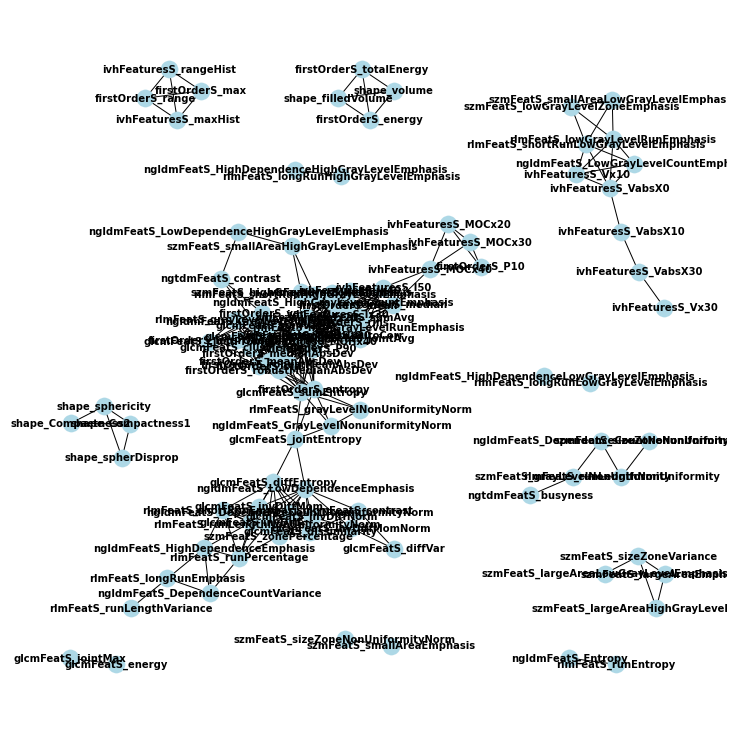

In [ ]:
# Radiomics network
import networkx as nx
cor_matrix = np.asmatrix(radiomics_network)
n=len(radiomicFeatsNorm.columns) ####################
variables=radiomicFeatsNorm.columns ##################
print(variables)
threshold=0.05
G=nx.Graph()

for i in range(n):
    for j in range(n):
      if i> j and abs(cor_matrix[i,j]) > threshold:
        G.add_edge(variables[i],variables[j], weight=abs(cor_matrix[i,j]))
        #G.add_edge(variables[i],variables[j], weight=1)

#print(G) 
print(nx.info(G)) 

plt.figure(1,figsize=(10,10)) 
nx.draw(G, pos = nx.nx_pydot.graphviz_layout(G), node_size=300, \
    node_color='lightblue', linewidths=0.25, font_size=10, \
    font_weight='bold', with_labels=True )
adj = nx.adjacency_matrix(G)

### Display largest connected component

In [ ]:
# Find largest component
Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
G0 = G.subgraph(Gcc[0])
plt.figure(2,figsize=(10,10)) 
nx.draw(G0, pos = nx.nx_pydot.graphviz_layout(G0), node_size=300, \
    node_color='lightblue', linewidths=0.25, font_size=10, \
    font_weight='bold', with_labels=True )

nodes0=G0.nodes # the largest
radiomicFeats_red_0=radiomicFeats[list(nodes0)] 
print(nodes0)

['firstOrderS_var', 'firstOrderS_std', 'firstOrderS_median', 'firstOrderS_mean', 'firstOrderS_entropy', 'firstOrderS_rms', 'firstOrderS_meanAbsDev', 'firstOrderS_medianAbsDev', 'firstOrderS_P90', 'firstOrderS_robustMeanAbsDev', 'firstOrderS_robustMedianAbsDev', 'firstOrderS_interQuartileRange', 'glcmFeatS_jointEntropy', 'glcmFeatS_jointAvg', 'glcmFeatS_jointVar', 'glcmFeatS_invDiffMomNorm', 'glcmFeatS_contrast', 'glcmFeatS_invDiff', 'glcmFeatS_invDiffMom', 'glcmFeatS_invDiffNorm', 'glcmFeatS_dissimilarity', 'glcmFeatS_diffEntropy', 'glcmFeatS_diffVar', 'glcmFeatS_sumAvg', 'glcmFeatS_sumVar', 'glcmFeatS_sumEntropy', 'glcmFeatS_clustTendency', 'glcmFeatS_clustPromin', 'glcmFeatS_autoCorr', 'rlmFeatS_grayLevelNonUniformityNorm', 'rlmFeatS_grayLevelVariance', 'rlmFeatS_highGrayLevelRunEmphasis', 'rlmFeatS_runLengthNonUniformityNorm', 'rlmFeatS_runLengthVariance', 'rlmFeatS_longRunEmphasis', 'rlmFeatS_runPercentage', 'rlmFeatS_shortRunEmphasis', 'rlmFeatS_shortRunHighGrayLevelEmphasis', 'ng